In [150]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os 
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification, TrainingArguments, Trainer, AutoModel
from datasets import Dataset, DatasetDict
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix                             
from pythainlp.tokenize import word_tokenize
from pythainlp.corpus.common import thai_stopwords
from pythainlp.tag import pos_tag
import re
from sklearn.feature_extraction.text import TfidfVectorizer                                               

In [151]:
label2id = {"neg": 0, "neu": 1, "pos": 2}
id2label = {0: "neg", 1: "neu", 2: "pos"}
# label2id = {"neg": 0, "pos": 1}
# id2label = {0: "neg", 1: "pos"}

In [152]:
#df = pd.read_excel("./Dataset/single_sentiment_3label.xlsx")
df = pd.read_excel("./Dataset/single_mix_3label_6type.xlsx")
df = pd.DataFrame(df)
df["label_id"] = df["label"].map(label2id)
df.dropna(subset=["paragraph", "label_id"], inplace=True)
df.head()

,paragraph,label,label_id
0,SJWD แย้มไตรมาส 4 สดใส มั่นใจดันรายได้ปีนี้แตะ...,pos,2
1,"“กัณฑรา” ชี้ SET ทดสอบ 1,500 จุด แนะสอย BBL หล...",pos,2
2,เม็ดเงิน “วายุภักษ์” ซื้อหุ้นค้าปลีก ดัน SET ป...,pos,2
3,โบรกแนะซื้อ MTC เป้า 55 บาท ชี้กำไรไตรมาส 3 แกร่ง,pos,2
4,OKJ วิ่งต่อ 15% รับแผนขยายสาขา ดันรายได้ 3 ปีโ...,pos,2


In [153]:
print("Total data size:", len(df))
print(df["label"].value_counts())

Total data size: 12031
label
pos    5344
neg    4534
neu    2153
Name: count, dtype: int64


In [154]:
print(df["paragraph"].iloc[25:35])

25    EP ทรงสวย ปี 67 รายได้แตะ 940.59 ลบ. เพิ่มขึ้น...
26    ปี 2568 การลงทุนของต่างชาติในไทยส่งสัญญาณบวก เ...
27    สัญญาน้ำมันดิบเวสต์เท็กซัส (WTI): งวดส่งมอบเดื...
28    วันนี้SETWB ปิดที่ระดับ 704.37 จุด เพิ่มขึ้น 3...
29    เช้าวันนี้SETWB ปิดที่ระดับ 704.12 จุด เพิ่มขึ...
30    SCAP ปักธงปี 2568 เติบโตต่อเนื่อง ตั้งเป้าสร้า...
31    ภาวะตลาดหุ้นนิวยอร์ก: ดัชนี Nasdaq ปิดที่ 19,0...
32    ภาวะตลาดหุ้นนิวยอร์ก: ดัชนี S&P500 ปิดที่ 5,95...
33    กิจการต่างประเทศดันกำไรซีพีเอฟ ปี 67 ทะลุ 19,0...
34    วันนี้ดัชนีตลาดหุ้นไทยปิดที่ 1,231.14 จุด เพิ่...
Name: paragraph, dtype: object


In [155]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df["label"])
print(train_df)
print(test_df)

                                               paragraph label  label_id
7830   มูลค่าการซื้อของนักลงทุนต่างชาติ แม้จะมีความผั...   pos         2
8194   ถึงแม้การลงทุนในทองคำจะไม่ได้สร้างผลกำไรมหาศาล...   pos         2
56     SA โชว์ผลงานปี 67 รายได้พุ่งแตะ 4,740 ลบ. ออลไ...   pos         2
7073   การลงทุนเพื่อลดหย่อนภาษี ถ้าไม่ใส่ใจเรื่องข้อจ...   pos         2
9153   เมื่อพิจารณาจากประสิทธิภาพการทำงาน ข้อเสียเรื่...   neg         0
...                                                  ...   ...       ...
96     วันนี้sSET ปิดที่ระดับ 660.41 จุด เพิ่มขึ้น 11...   pos         2
11853     การลงทุนในทองคำความไม่พร้อมสร้างการเตรียมตัว     neg         0
11379  มูลค่าการซื้อของนักลงทุนต่างชาติความหวาดกลัวคื...   neg         0
561    GULF นำทีม “หุ้นโรงไฟฟ้า” บวกคึก! รับดอกเบี้ยข...   pos         2
3094   KEX เปิดตัว “เจียเหว่ย จาง” นั่งผู้บริหารร่วม ...   neu         1

[9624 rows x 3 columns]
                                               paragraph label  label_id
2500   “วัน เรียลเอสเตท” จ

In [156]:
#   Create HuggingFace Dataset  from DataFrame
train_dataset = Dataset.from_pandas(train_df)
test_dataset  = Dataset.from_pandas(test_df)

raw_datasets = DatasetDict({
    "train": train_dataset,
    "test": test_dataset
})

print(train_dataset)
print(test_dataset)
print(raw_datasets)

Dataset({
    features: ['paragraph', 'label', 'label_id', '__index_level_0__'],
    num_rows: 9624
})
Dataset({
    features: ['paragraph', 'label', 'label_id', '__index_level_0__'],
    num_rows: 2407
})
DatasetDict({
    train: Dataset({
        features: ['paragraph', 'label', 'label_id', '__index_level_0__'],
        num_rows: 9624
    })
    test: Dataset({
        features: ['paragraph', 'label', 'label_id', '__index_level_0__'],
        num_rows: 2407
    })
})


In [157]:
model_name = "airesearch/wangchanberta-base-att-spm-uncased"  
#model_name = "my_wangchanberta_sentiment_model_cutall"
tokenizer = AutoTokenizer.from_pretrained(model_name)

In [158]:
max_length = 128
def tokenize_function(example):
    # ตรง "text" คือชื่อคอลัมน์ข้อความใน dataset
    return tokenizer(
        example["paragraph"],
        padding="max_length",            
        truncation=True,
        max_length=max_length
    )

In [159]:
tokenized_datasets = raw_datasets.map(tokenize_function, batched=True)

Map:   0%|          | 0/9624 [00:00<?, ? examples/s]

Map:   0%|          | 0/2407 [00:00<?, ? examples/s]

In [160]:
n = len(tokenized_datasets["train"])
for i in range(n):
    print(tokenized_datasets["train"][i])
    print("-----")

{'paragraph': 'มูลค่าการซื้อของนักลงทุนต่างชาติ แม้จะมีความผันผวนในระยะสั้น แต่แนวโน้มระยะยาวของความเชื่อมั่นในตลาดยังคงเป็นบวก', 'label': 'pos', 'label_id': 2, '__index_level_0__': 7830, 'input_ids': [5, 10, 1731, 24, 5008, 4262, 1555, 10, 8478, 21619, 21342, 294, 5041, 6383, 4331, 2119, 4349, 8523, 1867, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [161]:
tokenized_datasets = tokenized_datasets.remove_columns(["paragraph", "__index_level_0__","label"])

In [162]:
tokenized_datasets = tokenized_datasets.rename_column("label_id", "labels")

In [163]:
print(tokenized_datasets["train"][0])

{'labels': 2, 'input_ids': [5, 10, 1731, 24, 5008, 4262, 1555, 10, 8478, 21619, 21342, 294, 5041, 6383, 4331, 2119, 4349, 8523, 1867, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


In [164]:
#num_labels = 2
num_labels = 3

model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=num_labels,
    id2label=id2label,
    label2id=label2id,
)

Some weights of CamembertForSequenceClassification were not initialized from the model checkpoint at airesearch/wangchanberta-base-att-spm-uncased and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [165]:
batch_size = 8
logging_steps = 50
epochs = 12   

training_args = TrainingArguments( 
    output_dir="output-wangchanberta",
    eval_strategy="epoch",           # ประเมินทุก end of epoch
    save_strategy="epoch",                 # บันทึกโมเดลทุก end of epoch
    learning_rate=2e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=epochs,
    logging_steps=logging_steps,
    load_best_model_at_end=True,           # จะโหลดโมเดลที่ดีที่สุดตอนท้าย (ถ้ามี metric monitor)
    metric_for_best_model="accuracy",      # ตัวชี้วัดที่ใช้ตัดสินว่าโมเดลดีที่สุด
    greater_is_better=True,                 # ต้องการ accuracy สูงสุด
    weight_decay=0.05,
    gradient_accumulation_steps=2,         # ลด Memory Load และช่วยให้เรียนรู้ดีขึ้น
    lr_scheduler_type="linear",            # ใช้ Linear Decay
    warmup_steps=500,                      # ใช้ Warmup เพื่อให้โมเดลเริ่มเรียนรู้ได้ดีขึ้น
    report_to="none"  # ปิด WandB หรือ TensorBoard ถ้าไม่ใช้
)

In [166]:
from transformers import TrainerCallback

class EarlyStoppingCallback(TrainerCallback):
    def __init__(self, patience=3):
        self.patience = patience
        self.best_loss = float("inf")
        self.counter = 0

    def on_evaluate(self, args, state, control, metrics, **kwargs):
        val_loss = metrics["eval_loss"]
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                control.should_training_stop = True

# trainer = Trainer(..., callbacks=[EarlyStoppingCallback(patience=3)])


In [167]:
# from evaluate import load
# from sklearn.metrics import accuracy_score, precision_recall_fscore_support
# accuracy_metric = load("accuracy")


# def compute_metrics(eval_pred):
#     logits, labels = eval_pred
#     preds = np.argmax(logits, axis=-1)
#     precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='weighted')
#     acc = accuracy_score(labels, preds)
#     return {
#         'accuracy': acc,
#         'f1': f1,
#         'precision': precision,
#         'recall': recall
#     }

# trainer = Trainer(
#     model=model,
#     args=training_args,
#     train_dataset=tokenized_datasets["train"],
#     eval_dataset=tokenized_datasets["test"],
#     tokenizer=tokenizer,
#     compute_metrics=compute_metrics,
#     callbacks=[EarlyStoppingCallback(patience=3)]  # หยุดหาก 3 Epoch ไม่มี improvement
# )

In [168]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from sklearn.metrics import f1_score
import numpy as np

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=-1)

    precision, recall, f1, support = precision_recall_fscore_support(labels, preds, average=None, labels=[0, 1, 2])
    #precision, recall, f1, support = precision_recall_fscore_support(labels, preds, average=None, labels=[0, 1])

    acc = accuracy_score(labels, preds)

    f1_avg = f1_score(labels, preds, average="macro")

    return {
        'accuracy': acc,
        'f1': f1_avg,
        'precision_neg': precision[0],
        'recall_neg': recall[0],
        'f1_neg': f1[0],
        'support_neg': support[0],
        'precision_pos': precision[1],
        'recall_pos': recall[1],
        'f1_pos': f1[1],
        'support_pos': support[1],
        'support_neu': support[2],
        'precision_neu': precision[2],
        'recall_neu': recall[2],
        'f1_neu': f1[2],
        'support_neu': support[2],
    }

    # return {
    #     'accuracy': acc,
    #     'f1': f1_avg,
    #     'precision_neg': precision[0],
    #     'recall_neg': recall[0],
    #     'f1_neg': f1[0],
    #     'support_neg': support[0],
    #     'precision_pos': precision[1],
    #     'recall_pos': recall[1],
    #     'f1_pos': f1[1],
    #     'support_pos': support[1],
    #     # 'support_neu': support[2],
    #     # 'precision_neu': precision[2],
    #     # 'recall_neu': recall[2],
    #     # 'f1_neu': f1[2],
    #     # 'support_neu': support[2],
    # }

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["test"],
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(patience=3)]  # หยุดหาก 3 Epoch ไม่มี improvement
)


C:\Users\Asus\AppData\Local\Temp\ipykernel_8100\1141941737.py:52: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


In [169]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision Neg,Recall Neg,F1 Neg,Support Neg,Precision Pos,Recall Pos,F1 Pos,Support Pos,Support Neu,Precision Neu,Recall Neu,F1 Neu
1,0.394100,0.377290,0.835064,0.844692,0.809771,0.858875,0.833601,907,0.833333,0.951276,0.888407,431,1069,0.861490,0.768007,0.812067
2,0.234900,0.192000,0.936851,0.932105,0.982206,0.912900,0.946286,907,0.903890,0.916473,0.910138,431,1069,0.915705,0.965388,0.939891
3,0.168500,0.153706,0.960532,0.954396,0.978795,0.966924,0.972823,907,0.942446,0.911833,0.926887,431,1069,0.952468,0.974743,0.963477
4,0.079000,0.154233,0.966348,0.961224,0.988751,0.969129,0.978842,907,0.925339,0.948956,0.936999,431,1069,0.964684,0.971001,0.967832
5,0.083600,0.157694,0.966348,0.960496,0.975851,0.980154,0.977998,907,0.945368,0.923434,0.934272,431,1069,0.966512,0.971936,0.969216
6,0.074100,0.152119,0.968841,0.962057,0.983444,0.982359,0.982901,907,0.947242,0.916473,0.931604,431,1069,0.964945,0.978485,0.971667
7,0.071900,0.154011,0.968425,0.961446,0.979212,0.986770,0.982976,907,0.936471,0.923434,0.929907,431,1069,0.971910,0.971001,0.971455
8,0.031700,0.152394,0.972165,0.965361,0.986755,0.985667,0.986211,907,0.941176,0.928074,0.934579,431,1069,0.972119,0.978485,0.975291
9,0.032600,0.184973,0.968425,0.960878,0.980241,0.984564,0.982398,907,0.949029,0.907193,0.927639,431,1069,0.965867,0.979420,0.972596


TrainOutput(global_step=5418, training_loss=0.16519756572257113, metrics={'train_runtime': 3620.7595, 'train_samples_per_second': 31.896, 'train_steps_per_second': 1.992, 'total_flos': 5697457947482112.0, 'train_loss': 0.16519756572257113, 'epoch': 9.0})

In [170]:
eval_result = trainer.evaluate()
print("Evaluation result:", eval_result)
#trainer.save_model("my_wangchanberta_sentiment_model_cutall")
trainer.save_model("my_wangchanberta_sentiment_model")
# trainer.save_model("my_wangchanberta_sentiment_model_cutall_double")

Evaluation result: {'eval_loss': 0.15239420533180237, 'eval_accuracy': 0.9721645201495638, 'eval_f1': 0.9653605050133756, 'eval_precision_neg': 0.9867549668874173, 'eval_recall_neg': 0.9856670341786108, 'eval_f1_neg': 0.9862107004964148, 'eval_support_neg': 907, 'eval_precision_pos': 0.9411764705882353, 'eval_recall_pos': 0.9280742459396751, 'eval_f1_pos': 0.9345794392523364, 'eval_support_pos': 431, 'eval_support_neu': 1069, 'eval_precision_neu': 0.9721189591078067, 'eval_recall_neu': 0.9784845650140318, 'eval_f1_neu': 0.9752913752913753, 'eval_runtime': 31.841, 'eval_samples_per_second': 75.594, 'eval_steps_per_second': 9.453, 'epoch': 9.0}


In [171]:
predictions_output = trainer.predict(tokenized_datasets["test"])
pred_logits = predictions_output.predictions
pred_labels = np.argmax(pred_logits, axis=-1)
true_labels = predictions_output.label_ids

id2label = {0: "neg", 1: "neu", 2: "pos"}
#id2label = {0: "neg", 1: "pos"}

result_df = pd.DataFrame({
    "text": test_df["paragraph"].tolist(),
    "true_label": [id2label[l] for l in true_labels],
    "predicted_label": [id2label[l] for l in pred_labels]
})

print(result_df.head(10))

result_df.to_csv("prediction_results_2.csv", index=False, encoding="utf-8-sig")

cm = confusion_matrix(true_labels, pred_labels)
print("Confusion Matrix:\n", cm)

                                                text true_label  \
0  “วัน เรียลเอสเตท” จับมือ “สิงห์ เอสเตท” เปิดตั...        neu   
1  การลงทุนประกันมีแรงขายทำกำไรในบางกลุ่ม แต่ก็เป...        pos   
2  อัตราดอกเบี้ยประจำวันของธนาคารพาณิชย์ดัชนีราคา...        neg   
3  การลงทุนหุ้นต่างประเทศมีข่าวลบเกี่ยวกับเศรษฐกิ...        pos   
4   หุ้นกู้บริษัทพลังงานให้ผลตอบแทนดีแหล่งรายได้ลดลง        pos   
5  MOSHI บวก 3 วันพุ่ง 6% โบรกเชียร์ “ซื้อ” เคาะเ...        pos   
6  วันนี้SETCLMV ปิดที่ระดับ 656.88 จุด เพิ่มขึ้น...        pos   
7  RT ปิดบวก 3% หลังโชว์กำไรปี 67 โต 15% แตะ 71 ล...        pos   
8  การลงทุนในตลาดเงิน กำไรไม่ชัด ในแง่ของการลงทุน...        neg   
9  ทั้งๆ ที่ความ เสี่ยงจากการผิดนัดชำระหนี้มีอยู่...        pos   

  predicted_label  
0             neu  
1             pos  
2             neg  
3             pos  
4             pos  
5             pos  
6             pos  
7             pos  
8             neg  
9             pos  
Confusion Matrix:
 [[ 894    7    6]
 [   

In [172]:
wrong_preds = result_df[result_df["true_label"] != result_df["predicted_label"]]
print("mistake prediction example:\n", wrong_preds.head(10))

correct_preds = result_df[result_df["true_label"] == result_df["predicted_label"]]
print("correctness prediction example:\n", correct_preds.head(10))

mistake prediction example:
                                                   text true_label  \
29   “ทองคำ” เช้านี้ปรับขึ้น 400 บ. “รูปพรรณ” ขายออ...        neu   
112  กลุ่มบุญรอดฯ คว้ารางวัล องค์กรน่าร่วมงานที่สุด...        neu   
127  MASTER จับมือ “ไพโอเนียฯ” คว้ารางวัล Outstandi...        pos   
137                       TRUE แข็งแกร่งอย่างต่อเนื่อง        neu   
209            CEO คาดจีดีพีโต 2-3% กังวลหนี้ครัวเรือน        pos   
232  7 จังหวัดภาคใต้อ่วม! ฝนตก-น้ำท่วมหนัก กระทบประ...        neu   
241  ราคาขายปลีกน้ำมัน เมื่อชั่งน้ำหนักระหว่าง ภาระ...        neg   
268  LTS จับมือ “BytePlus” รุกบริการเทคฯ เสริมการค้...        neu   
337  “สศค.” เปิดผลเฮียริ่ง “Entertainment Complex” ...        pos   
365  SUN กางแผนปี 68 เล็งขยายตลาด “ตปท.” มุ่งขับเคล...        neu   

    predicted_label  
29              pos  
112             pos  
127             neu  
137             pos  
209             neg  
232             neg  
241             pos  
268             pos  
337          

Evaluation metrics: {'eval_loss': 0.15239420533180237, 'eval_accuracy': 0.9721645201495638, 'eval_f1': 0.9653605050133756, 'eval_precision_neg': 0.9867549668874173, 'eval_recall_neg': 0.9856670341786108, 'eval_f1_neg': 0.9862107004964148, 'eval_support_neg': 907, 'eval_precision_pos': 0.9411764705882353, 'eval_recall_pos': 0.9280742459396751, 'eval_f1_pos': 0.9345794392523364, 'eval_support_pos': 431, 'eval_support_neu': 1069, 'eval_precision_neu': 0.9721189591078067, 'eval_recall_neu': 0.9784845650140318, 'eval_f1_neu': 0.9752913752913753, 'eval_runtime': 32.1479, 'eval_samples_per_second': 74.873, 'eval_steps_per_second': 9.363, 'epoch': 9.0}
pred_output:
 PredictionOutput(predictions=array([[-2.8147168 ,  6.0802436 , -2.7772129 ],
       [-3.9915745 , -2.5686707 ,  6.6533933 ],
       [ 4.6172643 , -5.7036557 ,  0.66129196],
       ...,
       [-3.6499994 , -2.858049  ,  6.6442404 ],
       [ 6.877214  , -2.9779415 , -4.3814816 ],
       [ 7.001399  , -3.075155  , -4.253639  ]], dty

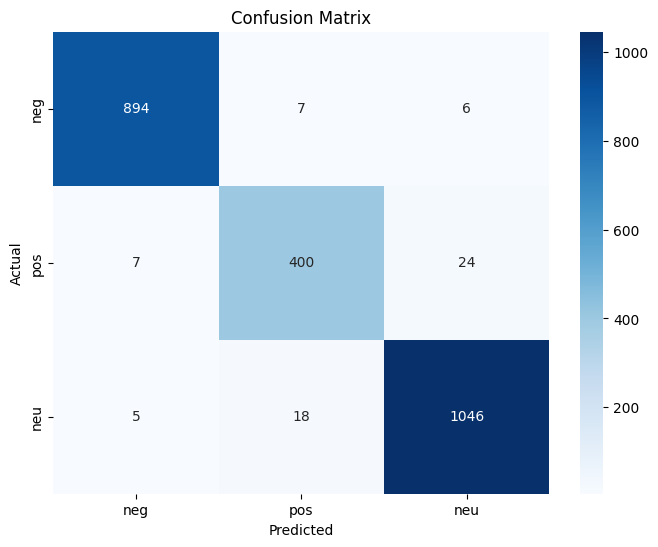

In [173]:
import matplotlib.pyplot as plt
import seaborn as sns
# Evaluate -> จะได้ acc, f1, precision, recall
eval_result = trainer.evaluate()
print("Evaluation metrics:", eval_result)

# Confusion Matrix
pred_output = trainer.predict(tokenized_datasets["test"])
pred_labels = np.argmax(pred_output.predictions, axis=-1)
true_labels = pred_output.label_ids
print("pred_output:\n", pred_output)
print("pred_labels:\n", pred_labels)
print("true_labels:\n", true_labels)

cm = confusion_matrix(true_labels, pred_labels)
print("Confusion Matrix (raw):\n", cm)

#label_names = ["neg", "pos"]  # ถ้ามี 3 label
label_names = ["neg", "pos", "neu"]  # ถ้ามี 3 label
df_cm = pd.DataFrame(cm, index=label_names, columns=label_names)
print("Confusion Matrix (DataFrame):\n", df_cm)
plt.figure(figsize=(8, 6))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [174]:
# from itertools import cycle
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve, average_precision_score

# # ข้อมูลที่มีอยู่จริง
# print("Shape of predictions:", pred_output.predictions.shape)  # (6, 2)
# print("Unique values in true_labels:", np.unique(true_labels))  # [0 1]

# # Mapping labels
# label2id = {"neg": 0, "pos": 1}
# id2label = {v: k for k, v in label2id.items()}

# # ดึงค่า F1-score ที่คำนวณได้จากโมเดล
# eval_result = trainer.evaluate()
# f1_score_avg = eval_result["eval_f1"]

# # กำหนดค่า iso-F1 scores แบบไดนามิก
# f_scores = np.linspace(f1_score_avg * 0.8, f1_score_avg * 1.2, num=4)
# print("Using dynamic F1-scores:", f_scores)

# # คำนวณ Precision-Recall Curve
# precision = {}
# recall = {}
# average_precision = {}

# # สำหรับคลาส neg (0)
# precision[0], recall[0], _ = precision_recall_curve(true_labels == 0, pred_output.predictions[:, 0])
# average_precision[0] = average_precision_score(true_labels == 0, pred_output.predictions[:, 0])

# # สำหรับคลาส pos (1)
# precision[1], recall[1], _ = precision_recall_curve(true_labels == 1, pred_output.predictions[:, 1])
# average_precision[1] = average_precision_score(true_labels == 1, pred_output.predictions[:, 1])


# # Micro-average - สร้าง one-hot encoding ด้วยตัวเอง
# y_true_binary = np.zeros((len(true_labels), 2))
# for i, label in enumerate(true_labels):
#     y_true_binary[i, label] = 1

# precision["micro"], recall["micro"], _ = precision_recall_curve(
#     y_true_binary.ravel(), pred_output.predictions.ravel()
# )
# average_precision["micro"] = average_precision_score(
#     y_true_binary, pred_output.predictions, average="micro"
# )

# # ตั้งค่าสีสำหรับกราฟ
# colors = ["navy", "darkorange", "gold"]

# _, ax = plt.subplots(figsize=(7, 8))

# # วาดเส้น iso-F1 curves
# for f_score in f_scores:
#     x = np.linspace(0.01, 1)
#     y = f_score * x / (2 * x - f_score)
#     plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.2)
#     plt.annotate(f"f1={f_score:0.2f}", xy=(0.9, y[45] + 0.02))

# # วาด Micro-average Precision-Recall Curve
# display = PrecisionRecallDisplay(
#     recall=recall["micro"],
#     precision=precision["micro"]
# )
# display.plot(ax=ax, name="Micro-average precision-recall", color=colors[2])

# # วาด Precision-Recall Curve สำหรับแต่ละคลาส
# for i in range(2):  # มี 2 คลาส
#     display = PrecisionRecallDisplay(
#         recall=recall[i],
#         precision=precision[i]
#     )
#     display.plot(ax=ax, name=f"Precision-Recall for {id2label[i]}", color=colors[i])

# # ตั้งค่า Legend และชื่อกราฟ
# ax.legend(loc="best")
# ax.set_title("Precision-Recall Curve for Binary Classification")

# plt.show()

Using dynamic F1-scores: [0.7722884  0.90100314 1.02971787 1.15843261]


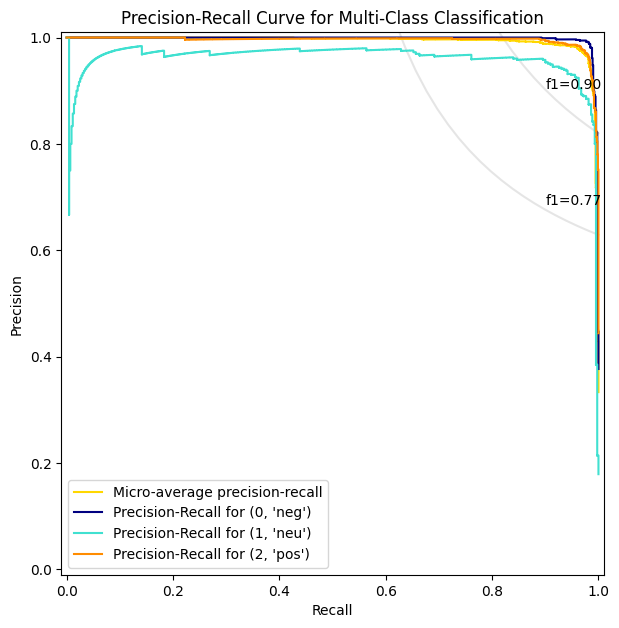

In [175]:
from itertools import cycle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize

# Mapping labels
label2id = {"neg": 0, "neu": 1, "pos": 2}
id2label = {v: k for k, v in label2id.items()}  # Reverse mapping

# ดึงค่า F1-score ที่คำนวณได้จากโมเดล
eval_result = trainer.evaluate()
f1_score_avg = eval_result["eval_f1"]  # ค่า F1-score เฉลี่ย

# กำหนดค่า iso-F1 scores แบบไดนามิก
f_scores = np.linspace(f1_score_avg * 0.8, f1_score_avg * 1.2, num=4)
print("Using dynamic F1-scores:", f_scores)

# แปลง true labels เป็น One-Hot Encoding
n_classes = len(label2id)  # จำนวนคลาส
true_labels_one_hot = label_binarize(true_labels, classes=list(label2id.values()))

# คำนวณ Precision-Recall Curve
precision = {}
recall = {}
average_precision = {}

for i in range(n_classes):
    y_true = true_labels_one_hot[:, i]
    y_scores = pred_output.predictions[:, i]
    precision[i], recall[i], _ = precision_recall_curve(y_true, y_scores)
    average_precision[i] = average_precision_score(y_true, y_scores)

# Micro-average
precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels_one_hot.ravel(), pred_output.predictions.ravel())
average_precision["micro"] = average_precision_score(true_labels_one_hot, pred_output.predictions, average="micro")

# ตั้งค่าสีสำหรับกราฟ
colors = cycle(["navy", "turquoise", "darkorange", "cornflowerblue", "teal"])

_, ax = plt.subplots(figsize=(7, 8))

# วาดเส้น iso-F1 curves
for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y = f_score * x / (2 * x - f_score)
    plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.2)
    plt.annotate(f"f1={f_score:0.2f}", xy=(0.9, y[45] + 0.02))

# วาด Micro-average Precision-Recall Curve
display = PrecisionRecallDisplay(
    recall=recall["micro"],
    precision=precision["micro"]
)
display.plot(ax=ax, name="Micro-average precision-recall", color="gold")

# วาด Precision-Recall Curve ของแต่ละคลาส
for i, color in zip(range(n_classes), colors):
    display = PrecisionRecallDisplay(
        recall=recall[i],
        precision=precision[i]
    )
    display.plot(ax=ax, name=f"Precision-Recall for {i , id2label[i]}", color=color)

# ตั้งค่า Legend และชื่อกราฟ
ax.legend(loc="best")
ax.set_title("Precision-Recall Curve for Multi-Class Classification")

plt.show()

In [176]:
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import pandas as pd
import numpy as np

# 1) Load Model and tokenizer (using model path which already fine-tune set up)
model_path = "my_wangchanberta_sentiment_model"  # or other names
model = AutoModelForSequenceClassification.from_pretrained(model_path)
tokenizer = AutoTokenizer.from_pretrained(model_path)

# Move to GPU if you have
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

# Create new unknown paragraph
new_texts = [
    # "วันนี้ข่าวดีมาก น่าลงทุน",
    # "แย่มาก ไม่พอใจการทิศทางของกราฟเลย",
    # "ก็โอเคนะ กราฟหุ้นตัวนี้ ไม่ได้แย่แต่ก็ไม่ดีมาก",
    # "ชอบบรรยากาศในหุ้นตัวนี้มากมาก",
    # "หุ้นตก ทิ้งดิ่ง รู้สึกแย่",
    # "หุ้นตัวนี้เฉย ๆ ไม่ประทับใจเท่าไร",
    # "หุ้นตัวนี้ ผลประกอบการดีเยี่ยม",
    # "รู้สึกงงกับระบบการจองหุ้นตัวนี้",
    # "หุ้นตัวสุดยอดเลย! ต้องซื้อเพิ่มอีกแน่นอน",
    # "SJWD แย้มไตรมาส 4 สดใส มั่นใจดันรายได้ปีนี้แตะ 2.5 หมื่นล้าน",
    # "เม็ดเงิน วายุภักษ์ ซื้อหุ้นค้าปลีก ดัน SET ปิดบวก 8 จุด แนวโน้มพรุ่งไซด์เวย์อัพ",
    # "SABUY อ่วมหนัก Q3 ขาดทุน 865 ล้านบาท ตลท. แขวนป้าย CB มีผล 18 พ.ย.นี้",
    # "เช้าวันนี้SETHD ปิดที่ระดับ 1,075.29  จุด ลดลง 7.48  จุด หรือ 0.69 %",
    # "ต่างชาติ เทขาย 3.4 พันล้านบาท กด SET ปิดลบ 9 จุด"
    "SJWD แย้มไตรมาส 4 สดใส มั่นใจดันรายได้ปีนี้แตะ 2.5 หมื่นล้าน",
"เช้าวันนี้SETESG ปิดที่ระดับ 755.66 จุด เพิ่มขึ้น 2.77 จุด หรือ 0.37 %",
"VIH ทุ่ม 200 ล้านบาท ประกาศซื้อหุ้นคืน พร้อมจ่ายเงินปันผลงวดผลงานปี 67 ในอัตรา 0.25 บาท หลังโชว์กำไรสุทธิ 315.55 ล้านบาท เพิ่มขึ้น 10.77%",
"PTG ปี 67 เติบโตแข็งแกร่ง มีกำไรสุทธิ 1,042 ล้านบาท เพิ่มขึ้น 7.9% YoY หลังธุรกิจ Oil ขยายตัว 12.3% -Non-Oil โตอย่างมีนัยสำคัญ พร้อมปันผลอัตรา 0.25 บาท",
"WPH โชว์รายได้ปี67 ทะลุ 2,000 ลบ.โตขึ้น 39% กำไรแตะ 283 ลบ.เพิ่มขึ้น 198% บอร์ดมีมติอนุมัติปันผลในอัตรา 25 หุ้นเดิมต่อ 1 หุ้นปันผล ลุยขยายบริการ ดันผลงานปีนี้ออลไทม์ไฮ",
"สรุป SET100 วันนี้ DELTA บวกสูงสุด 5%",
"MINT เด้ง 1% รับข่าวเตรียมตั้ง “กองรีท” มูลค่า 1.2 พันล้านดอลลาร์ มั่นใจรายได้ปีนี้โต 10%",
"MAGURO วิ่ง 4% ทำ “ออลไทม์ไฮ” มั่นใจรายได้ปีนี้โต 30% ลุยขยายสาขาเต็มสูบ",
"DELTA ดีดบวก 3% หลังหลุด “แคชบาลานซ์” วันแรก",
"“ทองคำ” เช้านี้ขึ้น 200 บ. “รูปพรรณ” ขายออก 42,800 บาท",
"SET บ่ายรูด 20 จุด กังวลท่องเที่ยวชะงัก “ญี่ปุ่น” เตือนพลเมืองเสี่ยงเกิด “วินาศกรรม” ไทย",
"“เงินบาท” เปิดเช้าอ่อนค่า 34.75 บ. หลังตลาดกังวล",
"วันนี้SETHD ปิดที่ระดับ 1,085.29 จุด ลดลง 6.51 จุด หรือ 0.60 %",
"KEX ปี67 แบกขาดทุน 5,911.3 ล้านบาท หลังปริมาณการส่งพัสดุจากกลุ่ม SKA วูบ- ปริมาณการจัดส่งลดลง 23%",
"SET ปิดเช้าร่วง 10 จุด หลุด 1,200 เซ่นบาทอ่อน-งบ บจ.ต่ำคาด",
"EA ร่วง 1% วิตกขายธุรกิจ “โซลาร์ฟาร์ม” พิษณุโลก 8 พันล้าน ส่อเพิ่มทุนต่ำ-เก็งหลุด SET50",
"SET ปิดลบ 2 จุด นลท.เทขายลดเสี่ยง กังวลเทรดวอร์ จับตา ครม.สัญจร พรุ่งนี้",
"S&P จัดอันดับเครดิต Boeing แนวโน้มลบ หลังพนักงาน 3.3 หมื่นคน หยุดงานประท้วงยืดเยื้อ",
"WTI ดิ่ง 3% หลุด 73 เหรียญ กังวลเศรษฐกิจจีนซบเซา หวั่นกระทบดีมานด์น้ำมัน",
"แนวโน้ม SET ซึมตัว เจอปัจจัยกดดัน บาทอ่อน-งบไตรมาส 3 ต่ำคาด",
"SKR คว้า SET ESG Ratings 2024 ระดับ “BBB”",
"WPH ลุยเปิด รพ.วัฒนแพทย์ ภูเก็ต Q4/69 ปักธงรองรับต่างชาติ",
"“ดัชนีฮั่งเส็ง” ปิดทะลุ 20,000 จุด รับ “จีน” กระตุ้นเศรษฐกิจเชิงรุกปี 68",
"MK ปรับโครงสร้างผู้ถือหุ้น หลัง “รวิพรรณ จารุทวี” เข้าถือ 20.92% ขึ้นเบอร์ 2",
"SET สัปดาห์นี้ “ฟื้นตัว” จับตา “เงินเฟ้อ” ไทย ต.ค.- เลือกตั้ง ปธน.สหรัฐฯ",
"แนวโน้ม SET รีบาวด์กรอบ 1,445-1,465 จุด",
"คัด 12 หุ้น รับประโยชน์ “ต่างชาติ” ลงทุนไทย 9 เดือน ทะลุ 7.2 แสนล้าน",
"KBANK โบรกอัพเป้า 165 บาท รับนโยบายเงินปันผลใหม่ 45%",
"SCM กางแผนธุรกิจปี 68 ชู 5 กลยุทธ์ มุ่งสู่องค์กรชั้นนำ-การเติบโตยั่งยืน",
"AGE เร่งปั้น ABM สู่เรือธง เดินเกมธุรกิจกรีน สร้างรายได้โตยั่งยืน",
"การลงทุนหุ้นไทยที่ ซบเซาอย่างหนัก แม้จะมี ข่าวดีจากภาคการท่องเที่ยว แต่ก็ยังไม่สามารถพลิกฟื้น ความเชื่อมั่นนักลงทุนได้",
"ความผันผวนของตลาดหุ้นไทยที่ น่ากังวล ถึงแม้จะ มีโอกาสทำกำไร ในหุ้นบางกลุ่ม แต่ก็ไม่คุ้มค่า กับความเสี่ยงที่ต้องเจอ",
"มูลค่าการซื้อของนักลงทุนต่างชาติที่ ลดลงอย่างน่าใจหาย ทำให้ การลงทุนหุ้นไทย ไม่น่าสนใจ เลย แม้จะมี มาตรการกระตุ้นเศรษฐกิจ ก็ไม่เพียงพอที่จะเห็นผล",
"ดัชนีราคาหลักทรัพย์ในไทย ปรับตัวลดลงต่อเนื่อง แม้จะมี กำไรของบริษัทจดทะเบียน ที่ยังดี แต่ก็ยังไม่ช่วย พยุงตลาดให้ดีขึ้น",
"การลงทุนหุ้นต่างประเทศมี ความเสี่ยงจากอัตราแลกเปลี่ยนสูง ถึงแม้จะ ให้ผลตอบแทนดี ในตลาดเทคโนโลยี แต่ก็ไม่สามารถชดเชย ความผันผวนของค่าเงินบาทได้",
"ตลาดหุ้นต่างประเทศที่ เผชิญกับภาวะเศรษฐกิจถดถอย ทำให้ การลงทุนหุ้นต่างประเทศ ดูไม่สดใส แม้จะมี บริษัทเติบโตสูง ก็ไม่ช่วย ให้พอร์ตโดยรวมเป็นบวก",
"การลงทุนในพันธบัตรรัฐบาลให้ ผลตอบแทนต่ำติดดิน แม้จะ มีความมั่นคงสูง แต่ก็ไม่คุ้มค่า เมื่อเทียบกับอัตราเงินเฟ้อที่พุ่งขึ้น",
"อัตราดอกเบี้ยประจำวันของธนาคารพาณิชย์ที่ ต่ำเตี้ยเรี่ยดิน ทำให้ การลงทุนในพันธบัตรรัฐบาล ไม่จูงใจ เลย ถึงแม้จะ ปลอดภัยไร้ความเสี่ยง ก็ไม่สามารถสร้างความมั่งคั่ง ได้จริง",
"การลงทุนในตลาดเงินให้ ผลตอบแทนเพียงน้อยนิด ถึงแม้จะ มีสภาพคล่องสูง แต่ก็ไม่เพียงพอ ที่จะสู้กับค่าครองชีพที่เพิ่มขึ้น",
"ราคาน้ำมันดิบในตลาดโลก พุ่งสูงขึ้นอย่างต่อเนื่อง ทำให้ ต้นทุนการผลิตของธุรกิจ เพิ่มขึ้นอย่างมาก แม้จะมี การค้นพบแหล่งน้ำมันใหม่ ก็ไม่สามารถบรรเทา ผลกระทบทั้งหมดได้",
"การลงทุนหุ้นไทย เมื่อเปรียบเทียบกับความผันผวนแล้ว ข้อเสียเรื่องสภาพคล่องที่จำกัดถือว่าเล็กน้อย",
"การลงทุนหุ้นต่างประเทศ ถ้าเทียบกับคู่แข่ง ปัญหาเรื่องความซับซ้อนของข้อมูลถือว่าไม่ใช่เรื่องใหญ่",
"การลงทุนในพันธบัตรรัฐบาล เมื่อดูจากมุมมองโดยรวม ข้อจำกัดเรื่องผลตอบแทนที่ต่ำไม่ได้สำคัญมาก",
"การลงทุนในตลาดเงิน เมื่อชั่งน้ำหนักดูแล้ว ข้อเสียเรื่องอัตราดอกเบี้ยต่ำไม่ได้มีน้ำหนักมาก",
"การลงทุนในทองคำ ถ้าเทียบกับประโยชน์ที่ได้รับ ปัญหาเรื่องราคาผันผวนถือว่าเล็กน้อย",
"การลงทุนในอสังหาริมทรัพย์ เมื่อพิจารณาจากภาพรวม ข้อบกพร่องเรื่องสภาพคล่องต่ำไม่ได้สำคัญมาก",
"การลงทุนในกองทุนรวม ถ้าเปรียบเทียบกับทางเลือกอื่น ข้อเสียเรื่องค่าธรรมเนียมยังยอมรับได้",
"การลงทุนตราสารหนี้ เมื่อดูจากมุมมองของผู้ใช้งาน ปัญหาเรื่องผลตอบแทนที่จำกัดไม่ได้เป็นอุปสรรคมาก",
"การลงทุนตราสารอนุพันธ์ ถ้าเทียบกับมาตรฐานทั่วไป ข้อจำกัดเรื่องความเสี่ยงสูงถือว่าปกติ",
"ราคาน้ำมันดิบในตลาดโลก เมื่อชั่งน้ำหนักข้อดีข้อเสียแล้ว ปัญหาเรื่องความผันผวนของราคาไม่ได้มีน้ำหนักมาก",
"ราคาน้ำมันดิบฟื้นตัวหลังจากการปรับตัวลง",
"น้ำมันเติบโตท่ามกลางความผันผวน",
"ราคาน้ำมันขายปลีกแข็งแกร่งจากการลดลง",
"อัตราแลกเปลี่ยนบาท-ดอลลาร์ปรับตัวดีจากความกังวล",
"ราคาน้ำมันดิบเด่นหลังจากการขายออก",
"อัตราแลกเปลี่ยนพุ่งแรงหลังจากการแก้ไข",
"ราคาน้ำมันขายปลีกเติบโตท่ามกลางเงินเฟ้อ",
"อัตราแลกเปลี่ยนบาท-ดอลลาร์แข็งแกร่งจากการขายทำกำไร",
"ราคาน้ำมันดิบฟื้นตัวหลังจากความไม่แน่นอน",
"อัตราแลกเปลี่ยนปรับตัวดีจากการชะลอตัว",
"หุ้นไทยขาดทุนเพิ่มขึ้น",
"หุ้นไทยตกต่ำฟื้นตัว",
"หุ้นไทยวิกฤตกลับรุ่ง",
"หุ้นไทยล้มเหลวสู่ความสำเร็จ",
"หุ้นไทยสูญเสียได้คืน",
"หุ้นไทยแย่ขึ้น",
"หุ้นไทยพลิกขาดทุนเป็นกำไร",
"หุ้นไทยวิกฤตเป็นโอกาส",
"หุ้นไทยปัญหาแก้ไขได้",
"หุ้นไทยอุปสรรคกลายเป็นบทเรียน",
]

# unknown paragraph Tokenize 
encoding = tokenizer(
    new_texts,
    padding=True,
    truncation=True,
    max_length=128,
    return_tensors="pt"
)

# Move to GPU if you have
encoding = {k: v.to(device) for k, v in encoding.items()}

# unknown paragraph prediction
with torch.no_grad():
    outputs = model(**encoding)
    logits = outputs.logits
    preds = torch.argmax(logits, dim=-1)

# convert label back to text symbol (neg, neu, pos)
# id2label = {0: "neg", 1: "pos"}
id2label = {0: "neg", 1: "neu", 2: "pos"}
predicted_labels = [id2label[p.item()] for p in preds]

# Create dataframe
df_results = pd.DataFrame({
    "text": new_texts,
    "predicted_label": predicted_labels
})

print(df_results)

df_results.to_csv("inference_results_2.csv", index=False, encoding="utf-8-sig")

                                                 text predicted_label
0   SJWD แย้มไตรมาส 4 สดใส มั่นใจดันรายได้ปีนี้แตะ...             pos
1   เช้าวันนี้SETESG ปิดที่ระดับ 755.66 จุด เพิ่มข...             pos
2   VIH ทุ่ม 200 ล้านบาท ประกาศซื้อหุ้นคืน พร้อมจ่...             pos
3   PTG ปี 67 เติบโตแข็งแกร่ง มีกำไรสุทธิ 1,042 ล้...             pos
4   WPH โชว์รายได้ปี67 ทะลุ 2,000 ลบ.โตขึ้น 39% กำ...             pos
..                                                ...             ...
65                                     หุ้นไทยแย่ขึ้น             neg
66                          หุ้นไทยพลิกขาดทุนเป็นกำไร             neg
67                              หุ้นไทยวิกฤตเป็นโอกาส             neg
68                               หุ้นไทยปัญหาแก้ไขได้             neg
69                      หุ้นไทยอุปสรรคกลายเป็นบทเรียน             neg

[70 rows x 2 columns]
